In [ ]:
import numpy as np
import pandas as pd
from google.colab import drive
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
from IPython.display import Image, display, Markdown
import matplotlib.cm as cm
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from time import perf_counter
import seaborn as sns
import warnings  # Import the warnings module

# Define a function to print Markdown text
def printmd(string):
    # Print with Markdowns
    display(Markdown(string))

warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
drive.mount('/content/drive')

# Define the path to your images directory in Google Drive
image_dir = Path('/content/drive/MyDrive/archive/gaussian_filtered_images/gaussian_filtered_images')

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

Mounted at /content/drive


In [ ]:
filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Show the result
image_df.head(10)

,Filepath,Label
0,/content/drive/MyDrive/archive/gaussian_filter...,No_DR
1,/content/drive/MyDrive/archive/gaussian_filter...,Moderate
2,/content/drive/MyDrive/archive/gaussian_filter...,No_DR
3,/content/drive/MyDrive/archive/gaussian_filter...,Moderate
4,/content/drive/MyDrive/archive/gaussian_filter...,Moderate
5,/content/drive/MyDrive/archive/gaussian_filter...,No_DR
6,/content/drive/MyDrive/archive/gaussian_filter...,Moderate
7,/content/drive/MyDrive/archive/gaussian_filter...,No_DR
8,/content/drive/MyDrive/archive/gaussian_filter...,Proliferate_DR
9,/content/drive/MyDrive/archive/gaussian_filter...,Moderate


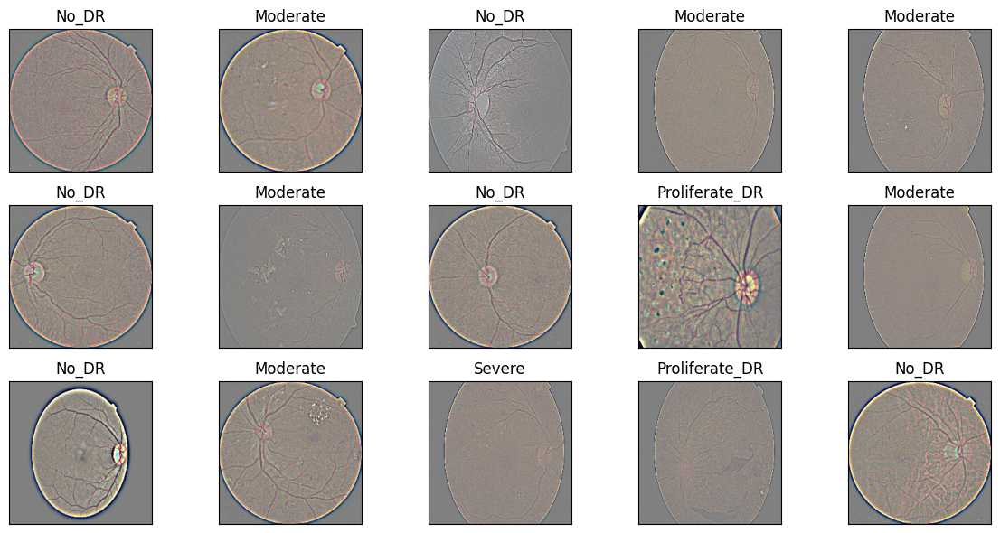

In [ ]:
# Display some pictures of the dataset with their labels
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 6),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

<ipython-input-5-9009e362abea>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = vc.index, y = vc, palette = "rocket")


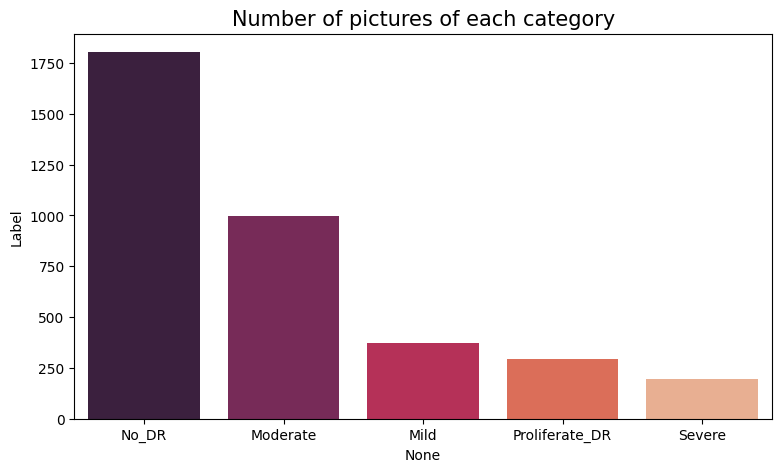

In [ ]:
# Display the number of pictures of each category
vc = image_df['Label'].value_counts()
plt.figure(figsize=(9,5))
sns.barplot(x = vc.index, y = vc, palette = "rocket")
plt.title("Number of pictures of each category", fontsize = 15)
plt.show()

In [ ]:
def create_gen():
    # Load the Images with a generator and Data Augmentation
    train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
        validation_split=0.1
    )

    test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
    )

    train_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='training',
        rotation_range=30, # Uncomment to use data augmentation
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    val_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='validation',
        rotation_range=30, # Uncomment to use data augmentation
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    test_images = test_generator.flow_from_dataframe(
        dataframe=test_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=False
    )

    return train_generator,test_generator,train_images,val_images,test_images

In [ ]:
def get_model(model):
# Load the pretained model
    kwargs =    {'input_shape':(224, 224, 3),
                'include_top':False,
                'weights':'imagenet',
                'pooling':'avg'}

    pretrained_model = model(**kwargs)
    pretrained_model.trainable = False

    inputs = pretrained_model.input

    x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
    x = tf.keras.layers.Dense(128, activation='relu')(x)

    outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.3, shuffle=True, random_state=42)

In [ ]:
# Dictionary with the models
models = {
    "DenseNet201": {"model": tf.keras.applications.DenseNet201, "perf": 0},
    "ResNet50": {"model": tf.keras.applications.ResNet50, "perf": 0},
    "VGG19": {"model": tf.keras.applications.VGG19, "perf": 0},
}

# Create the generators
train_generator, test_generator, train_images, val_images, test_images = create_gen()
print('\n')

# Define the number of epochs
epochs = 10  # Adjust the number of epochs as needed

# Fit the models
for name, model_info in models.items():

    # Get the model
    m = get_model(model_info['model'])
    model_info['model'] = m

    start = perf_counter()

    # Fit the model for multiple epochs
    history = m.fit(train_images, validation_data=val_images, epochs=epochs, verbose=1)

    # Save the duration
    duration = perf_counter() - start
    duration = round(duration, 2)
    model_info['perf'] = duration
    print(f"{name:20} trained in {duration} sec for {epochs} epochs")

    # Save validation accuracy for each epoch
    val_acc = history.history['val_accuracy']
    model_info['val_acc'] = [round(v, 4) for v in val_acc]

    # Save training accuracy for each epoch
    train_acc = history.history['accuracy']
    model_info['train_accuracy'] = [round(v, 4) for v in train_acc]

Found 2307 validated image filenames belonging to 5 classes.
Found 256 validated image filenames belonging to 5 classes.
Found 1099 validated image filenames belonging to 5 classes.


74836368/74836368 [==============================] - 3s 0us/step
Epoch 1/10
73/73 [==============================] - 881s 12s/step - loss: 0.8300 - accuracy: 0.7057 - val_loss: 0.9435 - val_accuracy: 0.5781
Epoch 2/10
73/73 [==============================] - 17s 226ms/step - loss: 0.6570 - accuracy: 0.7646 - val_loss: 0.7631 - val_accuracy: 0.7031
Epoch 3/10
73/73 [==============================] - 16s 221ms/step - loss: 0.5909 - accuracy: 0.7863 - val_loss: 0.7888 - val_accuracy: 0.6953
Epoch 4/10
73/73 [==============================] - 16s 219ms/step - loss: 0.5644 - accuracy: 0.7902 - val_loss: 0.7204 - val_accuracy: 0.7109
Epoch 5/10
73/73 [==============================] - 17s 236ms/step - loss: 0.5505 - accuracy: 0.7928 - val_loss: 0.7976 - val_accuracy: 0.6992
Epoch 6/10
73/73 [===================

In [ ]:
# Create a DataFrame with the results
models_result = []

for name, v in models.items():
    models_result.append([ name,
                          models[name]['train_accuracy'][-1],
                          models[name]['val_acc'][-1],
                          models[name]['perf']])

df_results = pd.DataFrame(models_result,
                          columns = ['model','train_accuracy','val_accuracy','Training time (sec)'])
df_results.sort_values(by='val_accuracy', ascending=False, inplace=True)
df_results.reset_index(inplace=True,drop=True)
df_results


,model,train_accuracy,val_accuracy,Training time (sec)
0,DenseNet201,0.8249,0.7188,1136.53
1,VGG19,0.7469,0.6680,185.88
2,ResNet50,0.7143,0.6406,188.97


In [ ]:
# Load the pretained model
pretrained_model = tf.keras.applications.DenseNet201(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

In [ ]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
73/73 [==============================] - 32s 279ms/step - loss: 0.8013 - accuracy: 0.7070 - val_loss: 0.8285 - val_accuracy: 0.6797
Epoch 2/10
73/73 [==============================] - 17s 235ms/step - loss: 0.6249 - accuracy: 0.7685 - val_loss: 0.9513 - val_accuracy: 0.6484
Epoch 3/10
73/73 [==============================] - 17s 227ms/step - loss: 0.6351 - accuracy: 0.7672 - val_loss: 0.7665 - val_accuracy: 0.6953
Epoch 4/10
73/73 [==============================] - 17s 229ms/step - loss: 0.5789 - accuracy: 0.7880 - val_loss: 0.7504 - val_accuracy: 0.6914
Epoch 5/10
73/73 [==============================] - 17s 227ms/step - loss: 0.5336 - accuracy: 0.7937 - val_loss: 0.7351 - val_accuracy: 0.6914
Epoch 6/10
73/73 [==============================] - 16s 224ms/step - loss: 0.5034 - accuracy: 0.8114 - val_loss: 0.7504 - val_accuracy: 0.6992
Epoch 7/10
73/73 [==============================] - 18s 246ms/step - loss: 0.5031 - accuracy: 0.8054 - val_loss: 0.7796 - val_accuracy: 0.7031

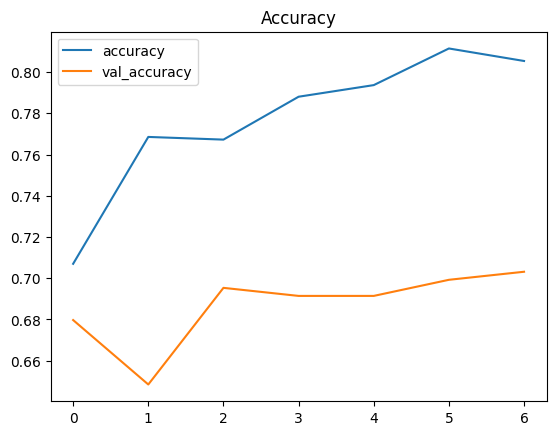

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

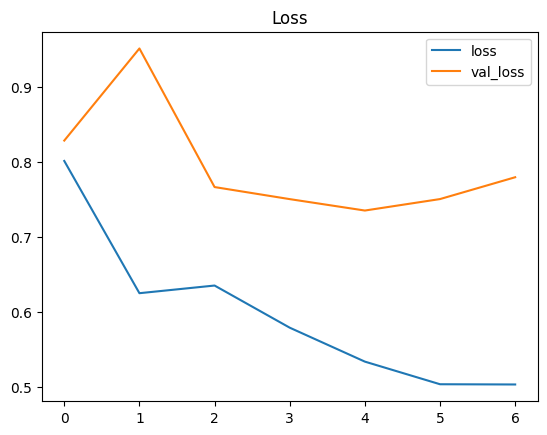

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
results = model.evaluate(test_images, verbose=0)
printmd(" ## Test Loss: {:.5f}".format(results[0]))
printmd("## Accuracy on the test set: {:.2f}%".format(results[1] * 100))

 ## Test Loss: 0.53702

## Accuracy on the test set: 81.07%

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

35/35 [==============================] - 10s 202ms/step
The first 5 predictions: ['Moderate', 'No_DR', 'Moderate', 'No_DR', 'Proliferate_DR']


In [ ]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                precision    recall  f1-score   support

          Mild       0.73      0.32      0.44       114
      Moderate       0.68      0.85      0.76       302
         No_DR       0.94      0.99      0.97       547
Proliferate_DR       0.55      0.45      0.50        86
        Severe       0.62      0.30      0.41        50

      accuracy                           0.81      1099
     macro avg       0.71      0.58      0.61      1099
  weighted avg       0.80      0.81      0.79      1099



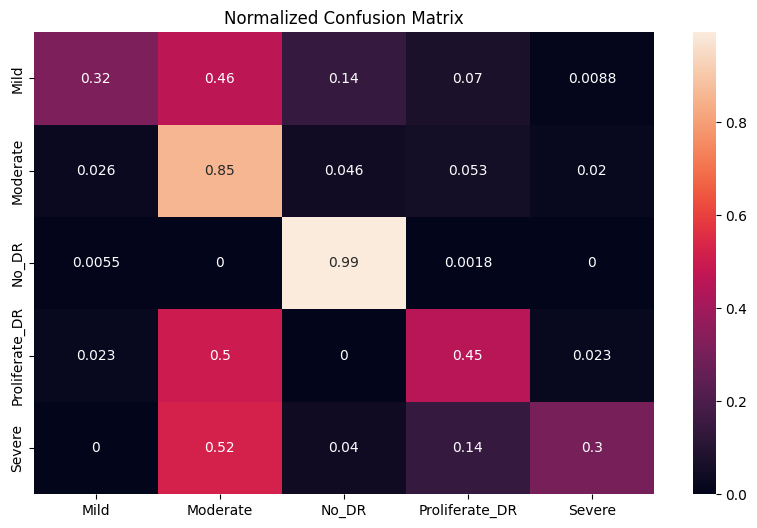

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

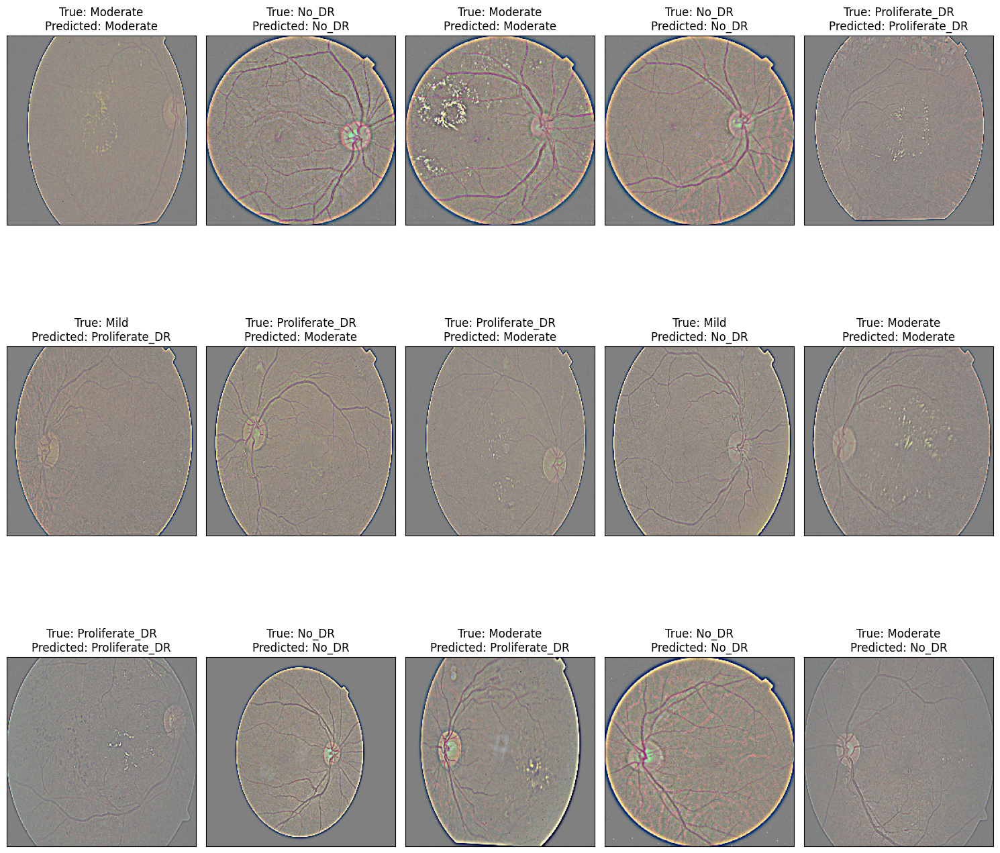

In [ ]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.416634 to fit



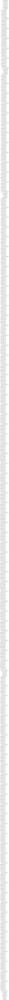

In [ ]:
# Visualize the model architecture using Graphviz with adjusted rankdir
plot_model(model, to_file='DenseNet201_model_architecture.png', show_shapes=True, show_layer_names=True, rankdir='TB')

In [ ]:
# Load the pretained model
pretrained_model = tf.keras.applications.ResNet50(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)


pretrained_model.trainable = False

In [ ]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
73/73 [==============================] - 21s 240ms/step - loss: 1.0363 - accuracy: 0.6134 - val_loss: 1.0619 - val_accuracy: 0.6133
Epoch 2/10
73/73 [==============================] - 17s 232ms/step - loss: 0.9048 - accuracy: 0.6680 - val_loss: 1.0177 - val_accuracy: 0.6289
Epoch 3/10
73/73 [==============================] - 17s 228ms/step - loss: 0.8830 - accuracy: 0.6775 - val_loss: 0.9957 - val_accuracy: 0.6406
Epoch 4/10
73/73 [==============================] - 16s 217ms/step - loss: 0.8678 - accuracy: 0.6818 - val_loss: 1.0110 - val_accuracy: 0.6289
Epoch 5/10
73/73 [==============================] - 17s 231ms/step - loss: 0.8610 - accuracy: 0.6849 - val_loss: 1.0351 - val_accuracy: 0.6211


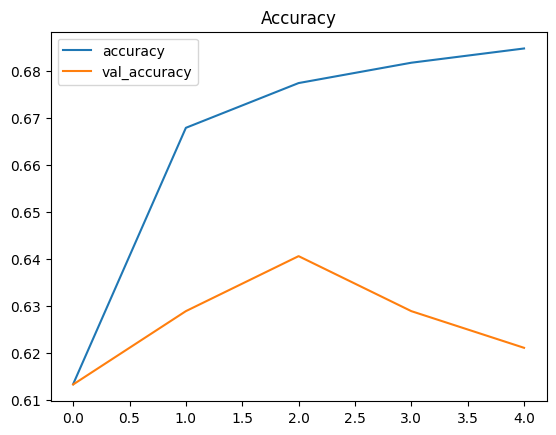

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

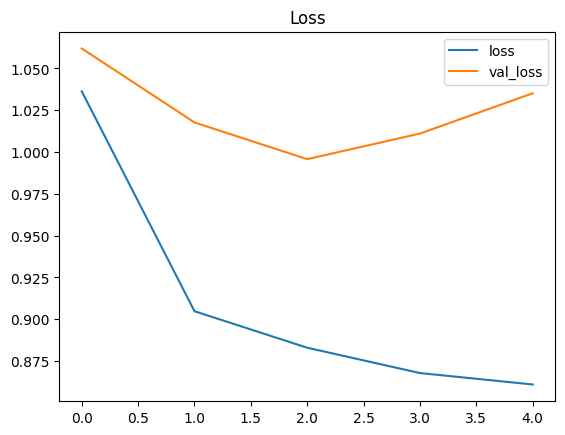

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
results = model.evaluate(test_images, verbose=0)
printmd(" ## Test Loss: {:.5f}".format(results[0]))
printmd("## Accuracy on the test set: {:.2f}%".format(results[1] * 100))

NameError: name 'model' is not defined

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

35/35 [==============================] - 7s 175ms/step
The first 5 predictions: ['Moderate', 'No_DR', 'No_DR', 'No_DR', 'Moderate']


In [ ]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                precision    recall  f1-score   support

          Mild       0.50      0.06      0.11       114
      Moderate       0.53      0.89      0.67       302
         No_DR       0.87      0.93      0.90       547
Proliferate_DR       0.00      0.00      0.00        86
        Severe       0.00      0.00      0.00        50

      accuracy                           0.71      1099
     macro avg       0.38      0.38      0.34      1099
  weighted avg       0.63      0.71      0.64      1099



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


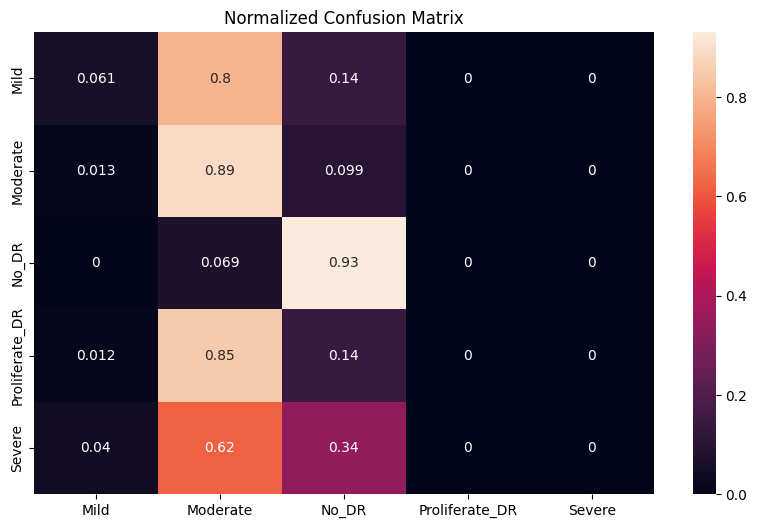

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

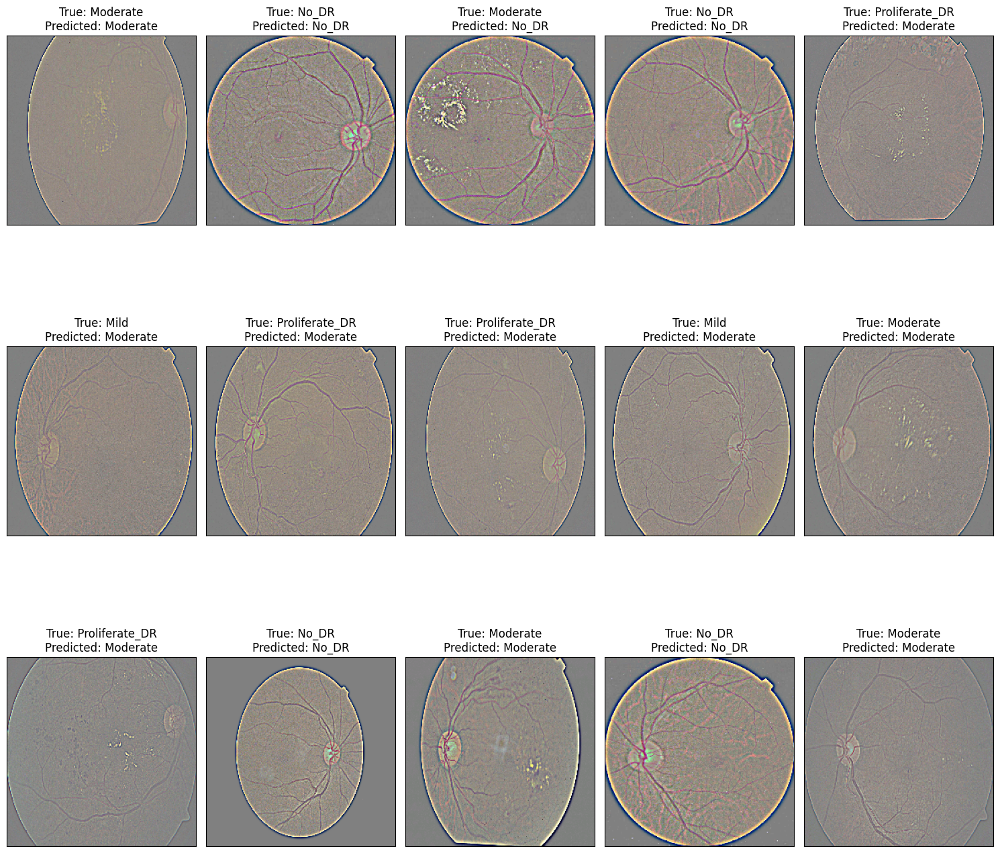

In [ ]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

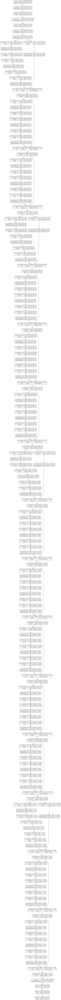

In [ ]:
plot_model(model, to_file='ResNet50_model_architecture.png', show_shapes=True, show_layer_names=True, rankdir='TB')

In [ ]:
# Load the pretained model
pretrained_model = tf.keras.applications.VGG19(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)


pretrained_model.trainable = False

In [ ]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
73/73 [==============================] - 18s 224ms/step - loss: 1.0512 - accuracy: 0.6337 - val_loss: 0.9862 - val_accuracy: 0.6211
Epoch 2/10
73/73 [==============================] - 16s 221ms/step - loss: 0.8381 - accuracy: 0.7065 - val_loss: 0.9910 - val_accuracy: 0.6250
Epoch 3/10
73/73 [==============================] - 16s 214ms/step - loss: 0.7905 - accuracy: 0.7156 - val_loss: 0.9153 - val_accuracy: 0.6328
Epoch 4/10
73/73 [==============================] - 16s 221ms/step - loss: 0.7751 - accuracy: 0.7143 - val_loss: 0.9176 - val_accuracy: 0.6289
Epoch 5/10
73/73 [==============================] - 16s 217ms/step - loss: 0.7656 - accuracy: 0.7204 - val_loss: 0.9035 - val_accuracy: 0.6406
Epoch 6/10
73/73 [==============================] - 17s 232ms/step - loss: 0.7350 - accuracy: 0.7304 - val_loss: 0.9201 - val_accuracy: 0.6484
Epoch 7/10
73/73 [==============================] - 16s 214ms/step - loss: 0.7076 - accuracy: 0.7430 - val_loss: 0.8582 - val_accuracy: 0.6602

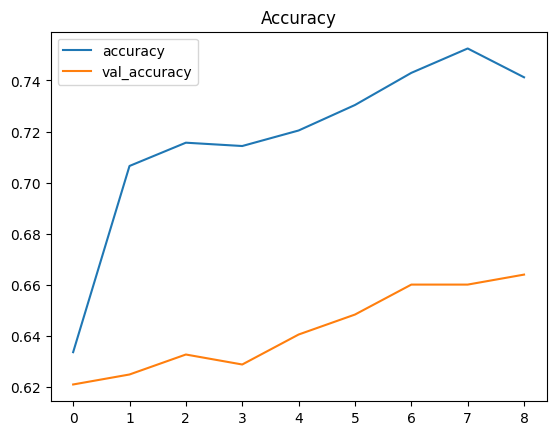

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

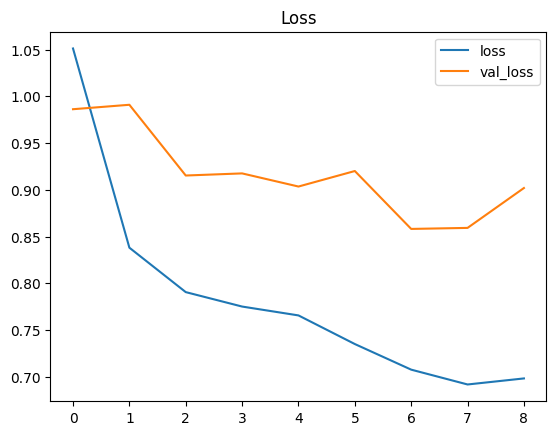

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
results = model.evaluate(test_images, verbose=0)
printmd(" ## Test Loss: {:.5f}".format(results[0]))
printmd("## Accuracy on the test set: {:.2f}%".format(results[1] * 100))

 ## Test Loss: 0.68057

## Accuracy on the test set: 75.34%

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

35/35 [==============================] - 8s 211ms/step
The first 5 predictions: ['Moderate', 'No_DR', 'Moderate', 'No_DR', 'Moderate']


In [ ]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                precision    recall  f1-score   support

          Mild       0.72      0.18      0.29       114
      Moderate       0.56      0.90      0.69       302
         No_DR       0.91      0.97      0.94       547
Proliferate_DR       1.00      0.01      0.02        86
        Severe       0.00      0.00      0.00        50

      accuracy                           0.75      1099
     macro avg       0.64      0.41      0.39      1099
  weighted avg       0.76      0.75      0.69      1099



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


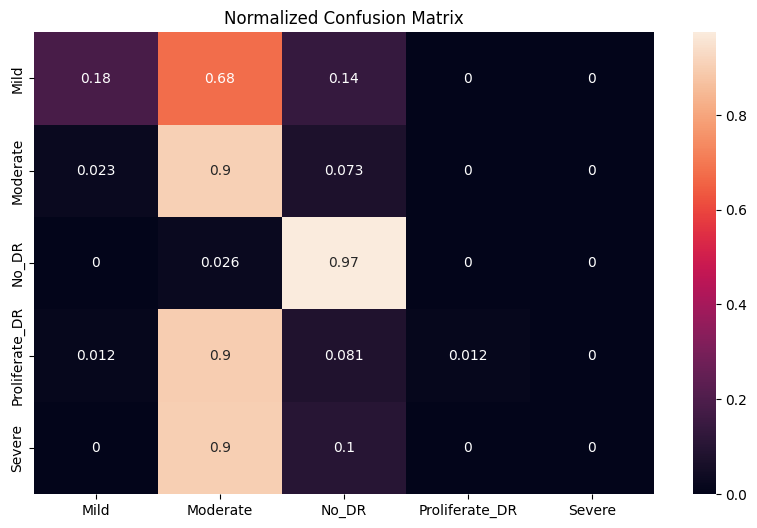

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

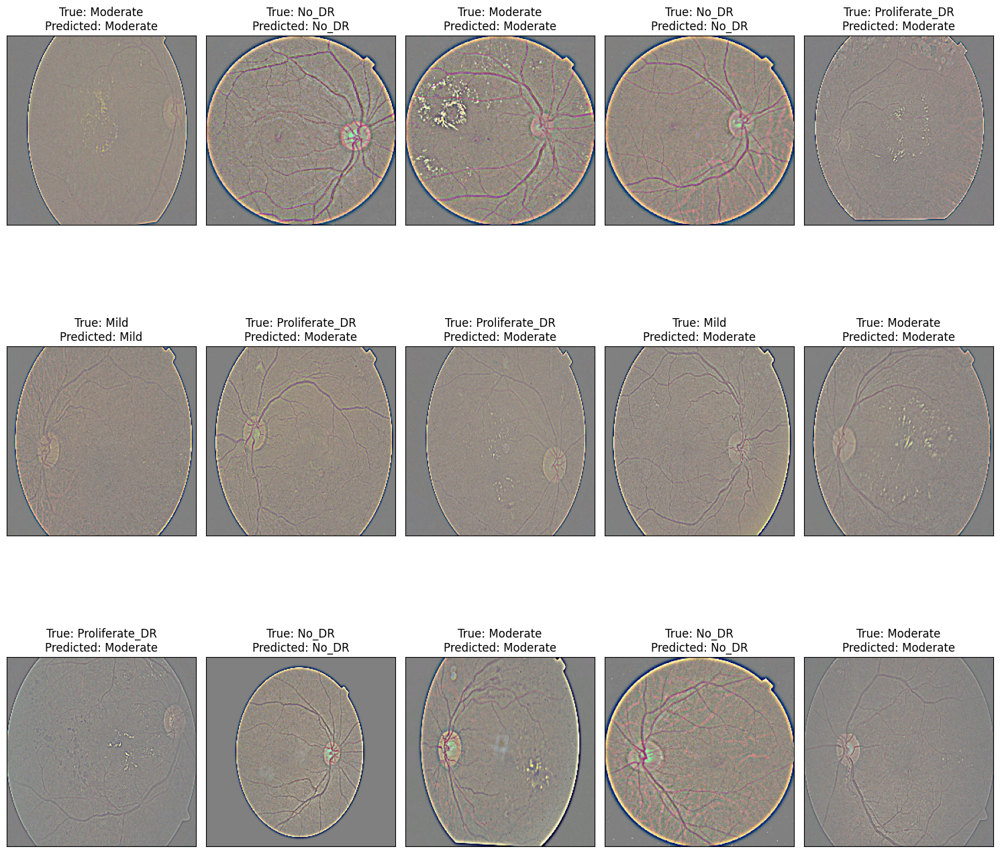

In [ ]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

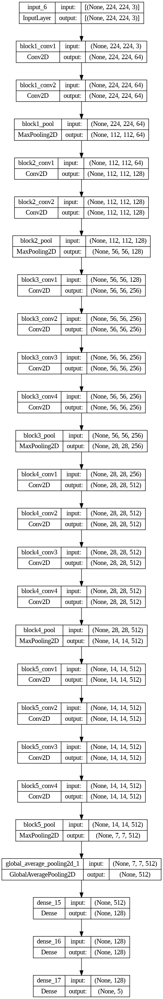

In [ ]:
plot_model(model, to_file='VGG19_model_architecture.png', show_shapes=True, show_layer_names=True, rankdir='TB')